In [2]:
import math
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import seaborn as sns
import tensorflow as tf
import tensorflow_addons as tfa

from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import Dense, Reshape,Dropout, GlobalAveragePooling2D, Input, BatchNormalization, LeakyReLU, Conv2D, MaxPooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import AdamW
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint
tf.random.set_seed(42)

d:\testing\.testenv\Lib\site-packages\tensorflow_addons\utils\tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


In [3]:
class DataProcessor:
    def __init__(self, base_path):
        self.base_path = base_path
        self.image_size = (416, 416)
        self.label_encoder = None
    
    def apply_augmentation(self, image, bbox):
        #return image, bbox

        bbox = tf.cast(bbox, tf.float32)
        
        h, w = float(self.image_size[0]), float(self.image_size[1])
        bbox_pixel = bbox * tf.constant([w, h, w, h], dtype=tf.float32)
        
        if tf.random.uniform([]) > 0.5:
            image = tf.image.flip_left_right(image)
            bbox_pixel = tf.stack([
                w - bbox_pixel[2],
                bbox_pixel[1],    
                w - bbox_pixel[0], 
                bbox_pixel[3]      
            ])
        
        if tf.random.uniform([]) > 0.5:
            angle = tf.random.uniform([], minval=-15, maxval=15) * math.pi / 180
            image = tfa.image.rotate(image, angle, fill_mode='constant', fill_value=1.0)

            
            center_x = (bbox_pixel[0] + bbox_pixel[2]) / 2
            center_y = (bbox_pixel[1] + bbox_pixel[3]) / 2
            width = bbox_pixel[2] - bbox_pixel[0]
            height = bbox_pixel[3] - bbox_pixel[1]
            
            cos_theta = tf.cos(angle)
            sin_theta = tf.sin(angle)
            new_center_x = (center_x - w/2) * cos_theta - (center_y - h/2) * sin_theta + w/2
            new_center_y = (center_x - w/2) * sin_theta + (center_y - h/2) * cos_theta + h/2
            
            expansion_factor = 1.2
            new_width = width * expansion_factor
            new_height = height * expansion_factor
            
            bbox_pixel = tf.stack([
                tf.clip_by_value(new_center_x - new_width/2, 0, w),
                tf.clip_by_value(new_center_y - new_height/2, 0, h),
                tf.clip_by_value(new_center_x + new_width/2, 0, w),
                tf.clip_by_value(new_center_y + new_height/2, 0, h)
            ])
        
        if tf.random.uniform([]) > 0.5:
            image = tf.image.random_brightness(image, 0.2)
            image = tf.image.random_contrast(image, 0.8, 1.2)
            image = tf.image.random_saturation(image, 0.8, 1.2)
            image = tf.image.random_hue(image, 0.1)
        
        if tf.random.uniform([]) > 0.5:
            noise = tf.random.normal(shape=tf.shape(image), mean=0.0, stddev=0.01)
            image = tf.clip_by_value(image + noise, 0.0, 1.0)
        
        bbox = bbox_pixel / tf.constant([w, h, w, h], dtype=tf.float32)
        return image, bbox

    def load_and_preprocess_image(self, filename, label, bbox):
        try:
            img = tf.io.read_file(filename)
            img = tf.image.decode_jpeg(img, channels=3)
            img = tf.image.resize(img, self.image_size)
            img = tf.cast(img, tf.float32) / 255.0

            bbox = tf.cast(bbox, tf.float32)

            img, bbox = self.apply_augmentation(img, bbox)
            return img, label, bbox
        except tf.errors.NotFoundError:
            tf.print(f"File not found: {filename}")
            img = tf.zeros(self.image_size + (3,), dtype=tf.float32)  # Return a zero-image tensor
            bbox = tf.zeros((4,), dtype=tf.float32)  # Default zero bounding box
            return img, label, bbox
        
#************************************batch size****************************************************

    def create_dataset(self, csv_file, base_dir, is_training=True, batch_size=16):
        df = pd.read_csv(csv_file)
        
        if self.label_encoder is None:
            self.label_encoder = LabelEncoder()
            df['class'] = self.label_encoder.fit_transform(df['class'])
        else:
            df['class'] = self.label_encoder.transform(df['class'])
            
        filenames = df['filename'].apply(lambda x: os.path.join(base_dir, x)).values
        labels = df['class'].values
        labels_one_hot = tf.keras.utils.to_categorical(labels, num_classes=3)
        
        bboxes = df[['xmin', 'ymin', 'xmax', 'ymax']].values.astype(np.float32)
        
        bboxes = bboxes / np.array([self.image_size[1] - 1, self.image_size[0] - 1,
                                    self.image_size[1] - 1, self.image_size[0] - 1], dtype=np.float32)
        
        
        dataset = tf.data.Dataset.from_tensor_slices((filenames, labels_one_hot, bboxes))
  
        
        dataset = dataset.map(
            lambda f, l, b: (self.load_and_preprocess_image(f, l, b)),
            num_parallel_calls=tf.data.AUTOTUNE
        )


        dataset = dataset.filter(lambda x, y, z: x is not None)
        
        def prepare_data(img, label, bbox):
            return img, {'class_output': label, 'bbox_output': bbox}
        
        dataset = dataset.map(prepare_data)
        
        if is_training:
            dataset = dataset.shuffle(buffer_size=1000)
        
        dataset = dataset.batch(batch_size).prefetch(tf.data.AUTOTUNE)
        
        return dataset


In [4]:
class VisionModel:
    def __init__(self, num_classes=3):
        self.num_classes = num_classes
        self.model = self._build_model()
        
    def _build_model(self):
        inputs = Input(shape=(416, 416, 3))        
        base_model = VGG16(weights='imagenet', include_top=False, input_shape=(416, 416, 3))
        
        for layer in base_model.layers:
            layer.trainable = False

        for layer in base_model.layers[-4:]:
            layer.trainable = True

        x = base_model(inputs)    
        
        def conv_block(x, filters):
            x = Conv2D(filters, (3, 3), padding='same', 
                        kernel_initializer='he_normal', kernel_regularizer=l2(0.0005))(x)
            x = BatchNormalization()(x)
            x = LeakyReLU(alpha=0.1)(x)

            x = Conv2D(filters, (3, 3), padding='same', 
                        kernel_initializer='he_normal', kernel_regularizer=l2(0.0005))(x)
            x = BatchNormalization()(x)
            x = LeakyReLU(alpha=0.1)(x)

            x = Conv2D(filters, (3, 3), padding='same', 
                        kernel_initializer='he_normal', kernel_regularizer=l2(0.0005))(x)
            x = BatchNormalization()(x)
            x = LeakyReLU(alpha=0.1)(x)

            x = MaxPooling2D(pool_size=(2, 2))(x)
            return x

        x = conv_block(x, 256)
        x = conv_block(x, 512)
        x = conv_block(x, 512)

        x = GlobalAveragePooling2D()(x)

        # Fully connected layers with residual connections
        def fc_block(x, units, dropout_rate=0.5):
            skip = x
            x = Dense(units, kernel_regularizer=l2(0.0005))(x)
            x = BatchNormalization()(x)
            x = LeakyReLU(alpha=0.1)(x)
            x = Dropout(dropout_rate)(x)
            if skip.shape[-1] == units:
                x = x + skip  # Residual connection
            return x

        x = fc_block(x, 512)
        x = fc_block(x, 256)
        x = fc_block(x, 128)

        # **Class Output: Uses Sigmoid for Multi-Label Classification**
        class_output = Dense(self.num_classes, activation='sigmoid', name='class_output')(x)
        # **Bounding Box Output: Uses Linear for precise coordinate regression**
        bbox_output = Dense(4, activation='linear', name='bbox_output')(x) 
        
        model = Model(inputs=inputs, outputs=[class_output, bbox_output])
        return model
        
    def compile_model(self, learning_rate=1e-5):
        optimizer = AdamW(
            learning_rate=learning_rate,
            weight_decay=0.0001,
            beta_1=0.9,
            beta_2=0.999,
            epsilon=1e-07
        )
        
        self.model.compile(
            optimizer=optimizer,
            loss={
                'class_output': 'binary_crossentropy',
                'bbox_output': 'huber' 
            },
            loss_weights={'class_output': 1.0, 'bbox_output': 1.0},
            metrics={
                'class_output': ['accuracy', tf.keras.metrics.TopKCategoricalAccuracy(k=3)],
                'bbox_output': ['mse',tf.keras.metrics.MeanSquaredError()]
            }
        )
    
    def get_callbacks(self, model_dir='model'):
        callbacks = [
            ReduceLROnPlateau(
                monitor='val_loss',
                factor=0.5,
                patience=5,
                min_lr=1e-6,
                verbose=1
            ),
            EarlyStopping(
                monitor='val_loss',
                patience=10,
                restore_best_weights=True,
                verbose=1
            ),
            ModelCheckpoint(
                os.path.join(model_dir, 'model-{epoch:02d}-{val_loss:.2f}.h5'),
                monitor='val_loss',
                save_best_only=True,
                verbose=1,
                save_weights_only=False
            )
        ]
        return callbacks


In [5]:
def plot_metrics(history):
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Model Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend(loc='upper right')

    plt.subplot(1, 2, 2)
    plt.plot(history.history['class_output_accuracy'], label='Training Accuracy')
    plt.plot(history.history['val_class_output_accuracy'], label='Validation Accuracy')
    plt.title('Model Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend(loc='upper right')
    
    plt.tight_layout()
    plt.show()


In [6]:
def train_model(
    base_path='dataset/',
    model_save_path='model/my_model_vgg25.h5',
    num_classes=3,
    epochs=100
):
    print("Initializing data processor...")
    data_processor = DataProcessor(base_path)
    
    print("Creating training dataset...")
    train_dataset = data_processor.create_dataset(
        os.path.join(base_path, 'train', '_annotations.csv'),
        os.path.join(base_path, 'train'),
        is_training=True
    )
    
    print("Creating validation dataset...")
    valid_dataset = data_processor.create_dataset(
        os.path.join(base_path, 'valid', '_annotations.csv'),
        os.path.join(base_path, 'valid'),
        is_training=False
    )
    
    print("Building model...")
    model = VisionModel(num_classes=num_classes)
    model.compile_model()
    model.model.summary()
    
    print("Starting training...")
    history = model.model.fit(
        train_dataset,
        epochs=epochs,
        validation_data=valid_dataset,
        callbacks=model.get_callbacks(),
    )
    
    print(f"Saving model to {model_save_path}...")
    model.model.save(model_save_path)
    print(f"Model training completed. Model saved to: {model_save_path}")
    plot_metrics(history)
    
    return model, history, data_processor

Initializing data processor...
Creating training dataset...
Creating validation dataset...
Building model...
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 416, 416, 3)]        0         []                            
                                                                                                  
 vgg16 (Functional)          (None, 13, 13, 512)          1471468   ['input_1[0][0]']             
                                                          8                                       
                                                                                                  
 conv2d (Conv2D)             (None, 13, 13, 256)          1179904   ['vgg16[0][0]']               
                                                                                    

d:\testing\.testenv\Lib\site-packages\keras\src\engine\training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


479/479 [==============================] - 3183s 7s/step - loss: 5.8541 - class_output_loss: 0.7099 - bbox_output_loss: 0.7945 - class_output_accuracy: 0.4577 - class_output_top_k_categorical_accuracy: 1.0000 - bbox_output_mse: 2.3368 - bbox_output_mean_squared_error: 2.3368 - val_loss: 5.2510 - val_class_output_loss: 0.5633 - val_bbox_output_loss: 0.3397 - val_class_output_accuracy: 0.6014 - val_class_output_top_k_categorical_accuracy: 1.0000 - val_bbox_output_mse: 0.7657 - val_bbox_output_mean_squared_error: 0.7657 - lr: 1.0000e-05
Epoch 2/100
479/479 [==============================] - ETA: 0s - loss: 5.7035 - class_output_loss: 0.6382 - bbox_output_loss: 0.7192 - class_output_accuracy: 0.5409 - class_output_top_k_categorical_accuracy: 1.0000 - bbox_output_mse: 2.0567 - bbox_output_mean_squared_error: 2.0567
Epoch 2: val_loss improved from 5.25103 to 5.13473, saving model to model\model-02-5.13.h5
479/479 [==============================] - 3118s 7s/step - loss: 5.7035 - class_output_

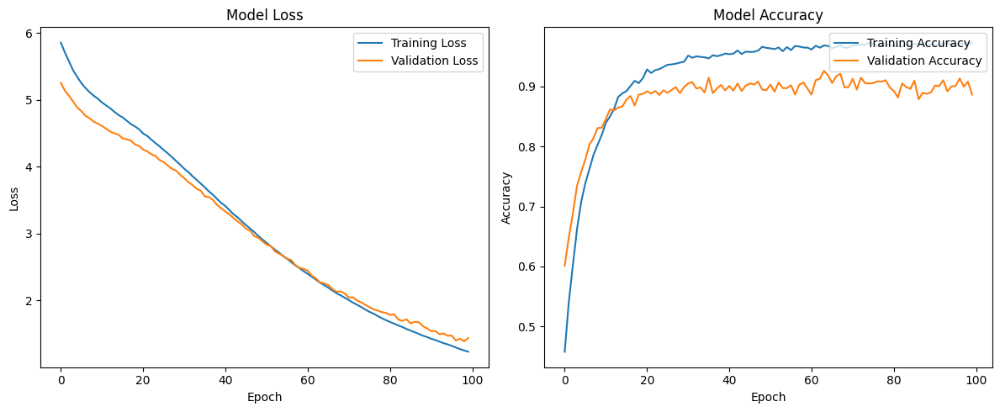

In [6]:
model, history, data_processor = train_model()

In [7]:
test_dataset = data_processor.create_dataset(
    os.path.join('dataset', 'test', '_annotations.csv'),
    os.path.join('dataset', 'test'),
    is_training=False
)

eval_results = model.model.evaluate(test_dataset, verbose=1)

total_loss, class_loss, bbox_loss, class_acc, top3_acc, bbox_mae, bbox_mse = eval_results


45/45 [==============================] - 195s 4s/step - loss: 1.4523 - class_output_loss: 0.2987 - bbox_output_loss: 0.0127 - class_output_accuracy: 0.8955 - class_output_top_k_categorical_accuracy: 1.0000 - bbox_output_mse: 0.0253 - bbox_output_mean_squared_error: 0.0253


45/45 [==============================] - 190s 4s/step
Total Loss: 1.4523
Classification Loss: 0.2987
Bounding Box Loss: 0.0127
Classification Accuracy: 0.8955
Top-3 Accuracy: 1.0000
Bounding Box MAE: 0.0253
Bounding Box MSE: 0.0253
Test Accuracy: 0.8844
F1 Score: 0.8813

Classification Report:
              precision    recall  f1-score   support

       knife       0.98      0.95      0.96       316
    long_gun       0.93      0.62      0.74       148
      pistol       0.78      0.96      0.86       254

    accuracy                           0.88       718
   macro avg       0.90      0.84      0.86       718
weighted avg       0.90      0.88      0.88       718



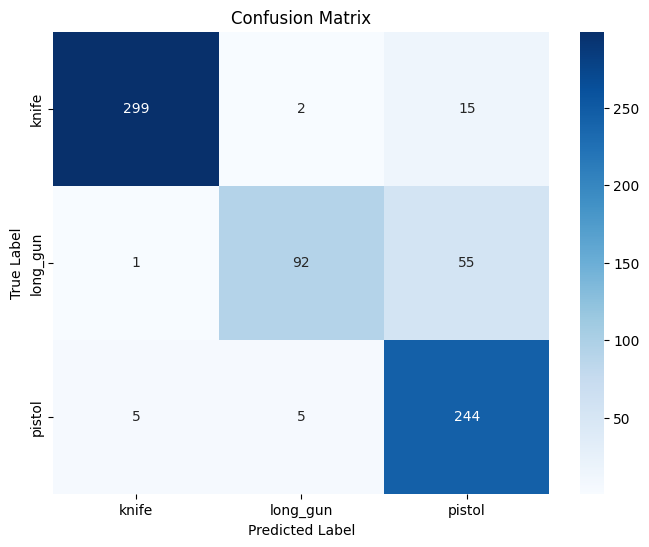

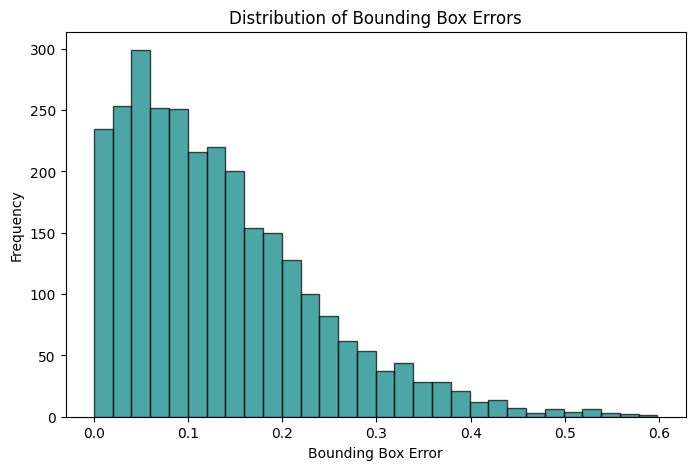

C:\Users\choud\AppData\Local\Temp\ipykernel_15600\1943964811.py:62: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=loss_labels, y=loss_values, palette="magma")


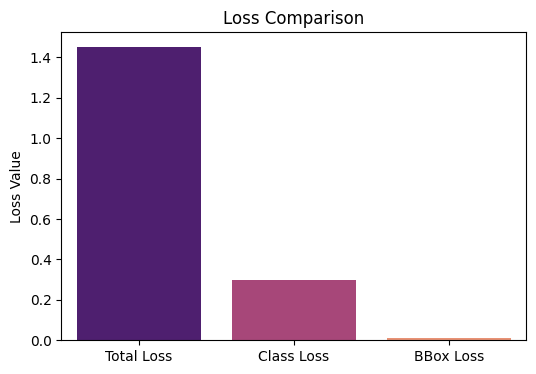

C:\Users\choud\AppData\Local\Temp\ipykernel_15600\1943964811.py:72: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=metrics_labels, y=metrics_values, palette="coolwarm")


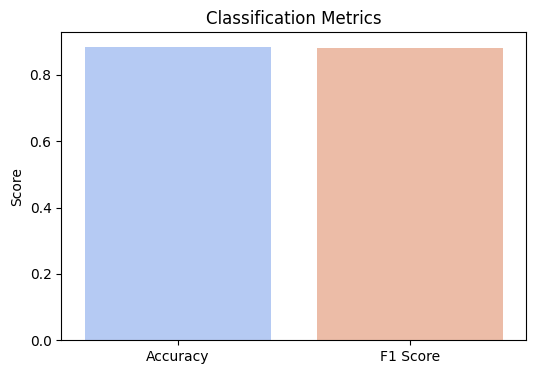

In [8]:
from sklearn.metrics import accuracy_score, f1_score

# --- 2. Make predictions ---
class_pred, bbox_pred = model.model.predict(test_dataset)
class_pred_labels = np.argmax(class_pred, axis=1)  # Convert probabilities to class labels

# Extract true class labels and bounding boxes
true_class_labels = []
true_bboxes = []
for images, labels in test_dataset.unbatch():
    true_class_labels.append(np.argmax(labels['class_output']))
    true_bboxes.append(labels['bbox_output'])

true_class_labels = np.array(true_class_labels)
true_bboxes = np.array(true_bboxes)

# --- 3. Compute Additional Metrics ---
accuracy = accuracy_score(true_class_labels, class_pred_labels)
f1 = f1_score(true_class_labels, class_pred_labels, average='weighted')

# --- 4. Print Evaluation Results ---
print(f"Total Loss: {total_loss:.4f}")
print(f"Classification Loss: {class_loss:.4f}")
print(f"Bounding Box Loss: {bbox_loss:.4f}")
print(f"Classification Accuracy: {class_acc:.4f}")
print(f"Top-3 Accuracy: {top3_acc:.4f}")
print(f"Bounding Box MAE: {bbox_mae:.4f}")
print(f"Bounding Box MSE: {bbox_mse:.4f}")
print(f"Test Accuracy: {accuracy:.4f}")
print(f"F1 Score: {f1:.4f}")

# --- 5. Classification Report ---
print("\nClassification Report:")
print(classification_report(true_class_labels, class_pred_labels, target_names=data_processor.label_encoder.classes_))

# --- 6. Confusion Matrix ---
plt.figure(figsize=(8, 6))
conf_matrix = confusion_matrix(true_class_labels, class_pred_labels)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=data_processor.label_encoder.classes_,
            yticklabels=data_processor.label_encoder.classes_)
plt.title('Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

# --- 7. Bounding Box Error Distribution ---
bbox_errors = np.abs(true_bboxes - bbox_pred).flatten()

plt.figure(figsize=(8, 5))
plt.hist(bbox_errors, bins=30, color='teal', alpha=0.7, edgecolor='black')
plt.xlabel('Bounding Box Error')
plt.ylabel('Frequency')
plt.title('Distribution of Bounding Box Errors')
plt.show()

# --- 8. Loss Comparison ---
loss_labels = ['Total Loss', 'Class Loss', 'BBox Loss']
loss_values = [total_loss, class_loss, bbox_loss]

plt.figure(figsize=(6, 4))
sns.barplot(x=loss_labels, y=loss_values, palette="magma")
plt.title('Loss Comparison')
plt.ylabel('Loss Value')
plt.show()

# --- 9. Classification Accuracy Bar Plot ---
metrics_labels = ['Accuracy', 'F1 Score']
metrics_values = [accuracy, f1]

plt.figure(figsize=(6, 4))
sns.barplot(x=metrics_labels, y=metrics_values, palette="coolwarm")
plt.title('Classification Metrics')
plt.ylabel('Score')
plt.show()


In [7]:
from tensorflow.keras.models import load_model
model = load_model('model\custom_25\model-64-2.27.h5')

In [8]:
# tf.saved_model.save(model, "model/saved_model")
# print("Model successfully converted to SavedModel format")

In [9]:
base_path = 'dataset/'
data_processor = DataProcessor(base_path)
test_dataset = data_processor.create_dataset(
    os.path.join(base_path, 'test', '_annotations.csv'),
    os.path.join(base_path, 'test'),
    is_training=False
)

y_pred = model.predict(test_dataset)
print(y_pred)

45/45 [==============================] - 204s 4s/step
[array([[0.03993523, 0.08138394, 0.8589673 ],
       [0.98470414, 0.00521094, 0.01527828],
       [0.9847941 , 0.00661122, 0.01235817],
       ...,
       [0.01457924, 0.9919456 , 0.00889541],
       [0.99332243, 0.004269  , 0.00538186],
       [0.01440375, 0.00401728, 0.9840027 ]], dtype=float32), array([[0.34071332, 0.34535843, 0.58626044, 0.6609516 ],
       [0.36310318, 0.39875224, 0.57015526, 0.6923429 ],
       [0.32907334, 0.28229088, 0.7066747 , 0.7748718 ],
       ...,
       [0.04133699, 0.11646333, 0.80823696, 0.7161033 ],
       [0.31543624, 0.349783  , 0.52507645, 0.7386877 ],
       [0.06117656, 0.11639979, 0.8257214 , 0.8833386 ]], dtype=float32)]


45/45 [==============================] - 197s 4s/step
Total Loss: 2.2744
Classification Loss: 0.1536
Bounding Box Loss: 0.0162
Classification Accuracy: 0.9276
Top-3 Accuracy: 1.0000
Bounding Box MAE: 0.0324
Bounding Box MSE: 0.0324
Test Accuracy: 0.9220
F1 Score: 0.9213

Classification Report:
              precision    recall  f1-score   support

       knife       0.97      0.98      0.97       316
    long_gun       0.88      0.80      0.84       148
      pistol       0.89      0.92      0.90       254

    accuracy                           0.92       718
   macro avg       0.91      0.90      0.91       718
weighted avg       0.92      0.92      0.92       718



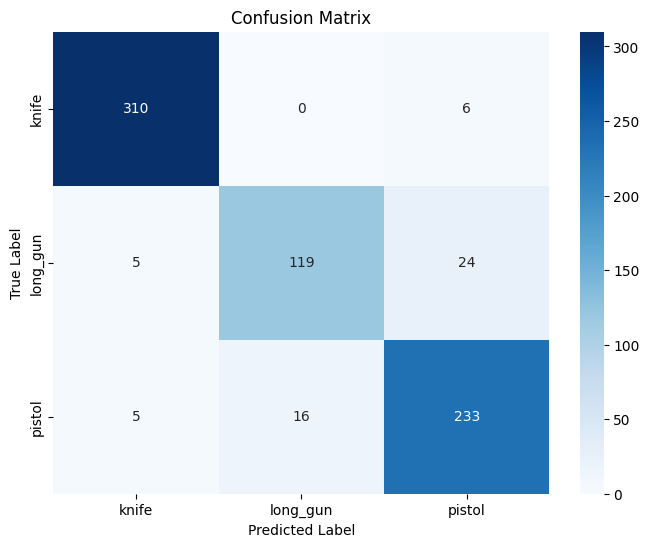

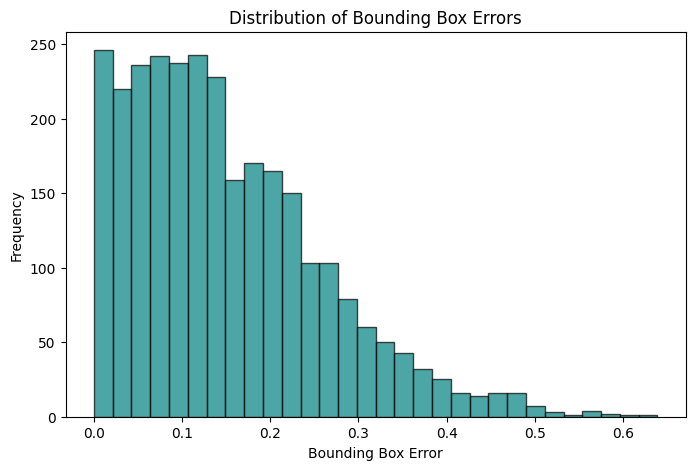

C:\Users\choud\AppData\Local\Temp\ipykernel_19220\2359142882.py:67: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=loss_labels, y=loss_values, palette="magma")


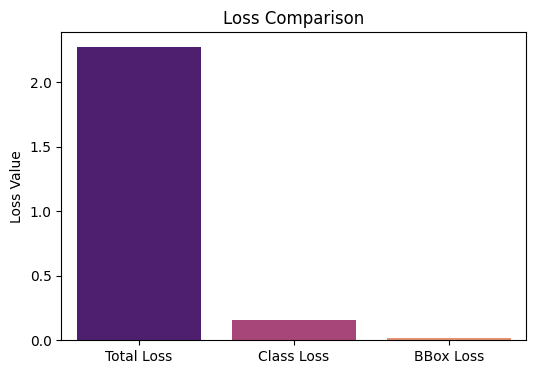

C:\Users\choud\AppData\Local\Temp\ipykernel_19220\2359142882.py:77: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=metrics_labels, y=metrics_values, palette="coolwarm")


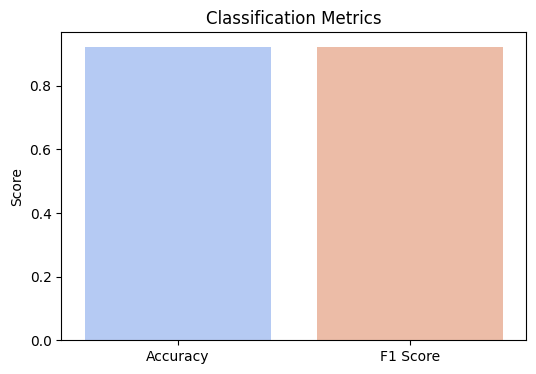

In [10]:
from sklearn.metrics import accuracy_score, f1_score

eval_results = model.evaluate(test_dataset, verbose=1)

total_loss, class_loss, bbox_loss, class_acc, top3_acc, bbox_mae, bbox_mse = eval_results


# --- 2. Make predictions ---
class_pred, bbox_pred = model.predict(test_dataset)
class_pred_labels = np.argmax(class_pred, axis=1)  # Convert probabilities to class labels

# Extract true class labels and bounding boxes
true_class_labels = []
true_bboxes = []
for images, labels in test_dataset.unbatch():
    true_class_labels.append(np.argmax(labels['class_output']))
    true_bboxes.append(labels['bbox_output'])

true_class_labels = np.array(true_class_labels)
true_bboxes = np.array(true_bboxes)

# --- 3. Compute Additional Metrics ---
accuracy = accuracy_score(true_class_labels, class_pred_labels)
f1 = f1_score(true_class_labels, class_pred_labels, average='weighted')

# --- 4. Print Evaluation Results ---
print(f"Total Loss: {total_loss:.4f}")
print(f"Classification Loss: {class_loss:.4f}")
print(f"Bounding Box Loss: {bbox_loss:.4f}")
print(f"Classification Accuracy: {class_acc:.4f}")
print(f"Top-3 Accuracy: {top3_acc:.4f}")
print(f"Bounding Box MAE: {bbox_mae:.4f}")
print(f"Bounding Box MSE: {bbox_mse:.4f}")
print(f"Test Accuracy: {accuracy:.4f}")
print(f"F1 Score: {f1:.4f}")

# --- 5. Classification Report ---
print("\nClassification Report:")
print(classification_report(true_class_labels, class_pred_labels, target_names=data_processor.label_encoder.classes_))

# --- 6. Confusion Matrix ---
plt.figure(figsize=(8, 6))
conf_matrix = confusion_matrix(true_class_labels, class_pred_labels)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=data_processor.label_encoder.classes_,
            yticklabels=data_processor.label_encoder.classes_)
plt.title('Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

# --- 7. Bounding Box Error Distribution ---
bbox_errors = np.abs(true_bboxes - bbox_pred).flatten()

plt.figure(figsize=(8, 5))
plt.hist(bbox_errors, bins=30, color='teal', alpha=0.7, edgecolor='black')
plt.xlabel('Bounding Box Error')
plt.ylabel('Frequency')
plt.title('Distribution of Bounding Box Errors')
plt.show()

# --- 8. Loss Comparison ---
loss_labels = ['Total Loss', 'Class Loss', 'BBox Loss']
loss_values = [total_loss, class_loss, bbox_loss]

plt.figure(figsize=(6, 4))
sns.barplot(x=loss_labels, y=loss_values, palette="magma")
plt.title('Loss Comparison')
plt.ylabel('Loss Value')
plt.show()

# --- 9. Classification Accuracy Bar Plot ---
metrics_labels = ['Accuracy', 'F1 Score']
metrics_values = [accuracy, f1]

plt.figure(figsize=(6, 4))
sns.barplot(x=metrics_labels, y=metrics_values, palette="coolwarm")
plt.title('Classification Metrics')
plt.ylabel('Score')
plt.show()


1/1 [==============================] - 0s 291ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.042754352..1.1687595].


1/1 [==============================] - 0s 290ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.25340098..0.93389106].


1/1 [==============================] - 0s 293ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.15644976..1.2042248].


1/1 [==============================] - 0s 377ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.09131073..1.0714556].


1/1 [==============================] - 0s 343ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.176478..0.920823].


1/1 [==============================] - 0s 291ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07824868..1.0017176].


1/1 [==============================] - 0s 316ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.029409707..0.91979456].


1/1 [==============================] - 0s 304ms/step


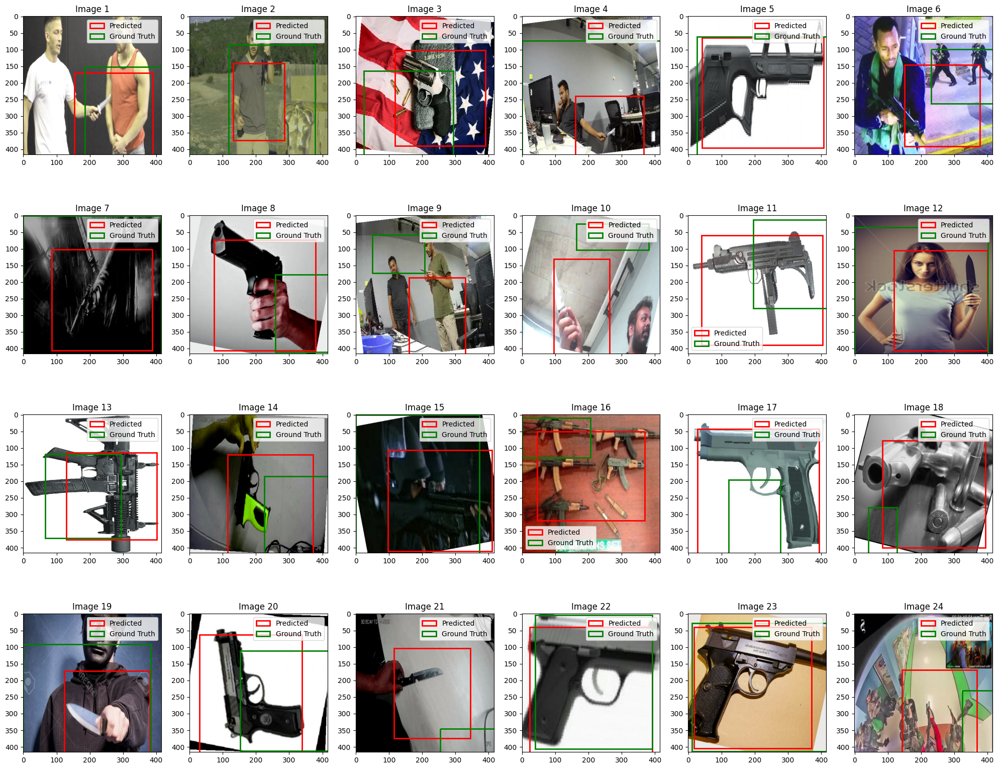

In [11]:
def plot_image_with_boxes(image, pred_boxes, true_boxes=None, ax=None):
    if ax is None:
        ax = plt.gca()
    
    ax.imshow(image, cmap='gray')
    
    height, width = image.shape[:2]
    
    if pred_boxes is not None:
        box = pred_boxes[0]
        x = box[0] * width
        y = box[1] * height
        w = box[2] * width
        h = box[3] * height
        
        ax.add_patch(plt.Rectangle((x, y), w, h, 
                                 fill=False, 
                                 color='red', 
                                 linewidth=2,
                                 label='Predicted'))
    
    if true_boxes is not None:
        box = true_boxes[0]
        x = box[0] * width
        y = box[1] * height
        w = box[2] * width
        h = box[3] * height
        
        ax.add_patch(plt.Rectangle((x, y), w, h, 
                                 fill=False, 
                                 color='green', 
                                 linewidth=2,
                                 label='Ground Truth'))
    
    ax.legend()

def plot_multiple_images(test_dataset, num_images, rows, cols):
    fig, axes = plt.subplots(rows, cols, figsize=(20, 4*rows))
    axes = axes.ravel() 
    
    for i, batch in enumerate(test_dataset.take(num_images)):
        if i >= num_images:
            break
            
        image = batch[0][1].numpy()
        true_boxes = batch[1]['bbox_output'][0].numpy()
        
        pred_boxes = model.predict(image[np.newaxis, ...])[1][0]
        
        plot_image_with_boxes(image, [pred_boxes], [true_boxes], ax=axes[i])
        axes[i].set_title(f'Image {i+1}')
    
    plt.tight_layout()
    plt.show()

num_images = 24  
rows = 4      
cols = 6        

plot_multiple_images(test_dataset, num_images, rows, cols)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.04106146..1.1670923].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.12330386..1.0923512].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.32102114..1.1323509].


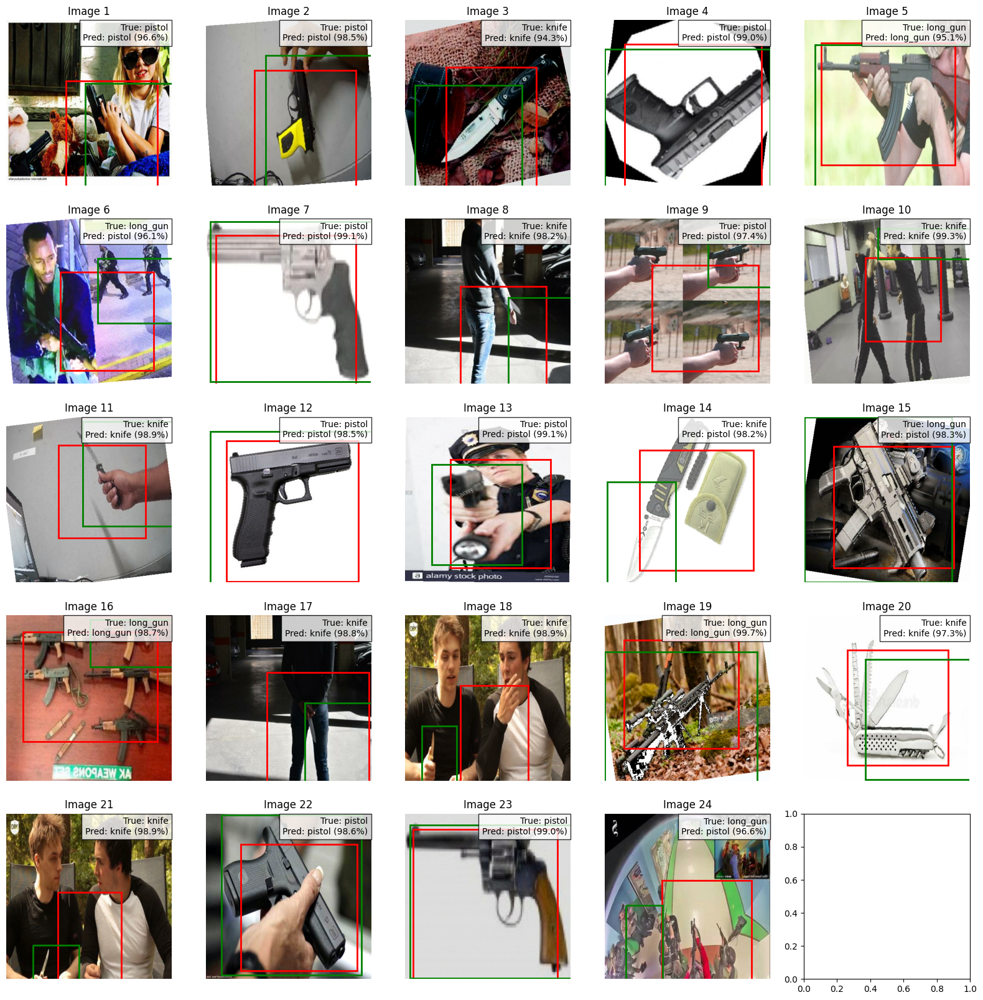

In [12]:
# Define class names
class_names = ['knife','long_gun','pistol']  # ensure this matches training order

def clip_box(box):
    return np.clip(box,0.0,1.0)

# Plot image with both predicted and true bounding boxes and labels
def plot_image_with_boxes(image, pred_box, pred_label, pred_score,
                          true_box=None, true_label=None, ax=None):
    if ax is None:
        ax = plt.gca()
    if image.max() <= 1.0:
        image = (image * 255).astype("uint8")
   
    # Ensure the image is displayable (handle potential channel issues)
    if len(image.shape) == 2:  # Grayscale
        ax.imshow(image, cmap='gray')
    else:  # Color image
        ax.imshow(image)
       
    img_height, img_width = image.shape[:2]
    
    # Create label text for top right corner
    label_text = f"True: {true_label}\nPred: {pred_label} ({pred_score:.1%})"
    ax.text(img_width * 0.98, img_height * 0.02, label_text,
            color='black', fontsize=10, bbox=dict(facecolor='white', alpha=0.8),
            horizontalalignment='right', verticalalignment='top')
    
    # Draw predicted box
    if pred_box is not None:
        pred_box = clip_box(pred_box)
        x1 = pred_box[0] * img_width
        y1 = pred_box[1] * img_height
        w = pred_box[2] * img_width
        h = pred_box[3] * img_height
        ax.add_patch(plt.Rectangle((x1, y1), w, h, edgecolor='red', linewidth=2, fill=False))
        
    # Draw ground truth box
    if true_box is not None:
        true_box = clip_box(true_box)
        x1 = true_box[0] * img_width
        y1 = true_box[1] * img_height
        w = true_box[2] * img_width
        h = true_box[3] * img_height
        ax.add_patch(plt.Rectangle((x1, y1), w, h, edgecolor='green', linewidth=2, fill=False))
        
    ax.axis('off')

def plot_multiple_images(test_dataset, num_images, rows, cols, model, threshold=0.5):
    fig, axes = plt.subplots(rows, cols, figsize=(20, 4 * rows))
    axes = axes.ravel()
    class_names = ['knife','long_gun','pistol']
    for i, batch in enumerate(test_dataset.take(num_images)):
        if i >= num_images:
            break
        image = batch[0][0].numpy()
        true_box = batch[1]['bbox_output'][0].numpy()
        true_class_vector = batch[1]['class_output'][0].numpy()
        # Get true label
        true_idx = np.argmax(true_class_vector)
        true_label = class_names[true_idx]
        # Model prediction
        class_pred, bbox_pred = model.predict(image[np.newaxis, ...], verbose=0)
        class_pred = class_pred[0]
        bbox_pred = bbox_pred[0]
        pred_idx = np.argmax(class_pred)
        pred_score = class_pred[pred_idx]
        pred_label = class_names[pred_idx] if pred_score > threshold else "no weapon"
        # Plot everything
        plot_image_with_boxes(
            image,
            bbox_pred,
            pred_label,
            pred_score,
            true_box,
            true_label,
            ax=axes[i]
        )
        axes[i].set_title(f"Image {i+1}")

    plt.show()

plot_multiple_images(test_dataset, num_images=24, rows=5, cols=5, model=model)

1/1 [==============================] - 0s 285ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.18507254..1.0705372].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.04106146..1.1670923].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.32097337..1.132304].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.03799489..0.998772].


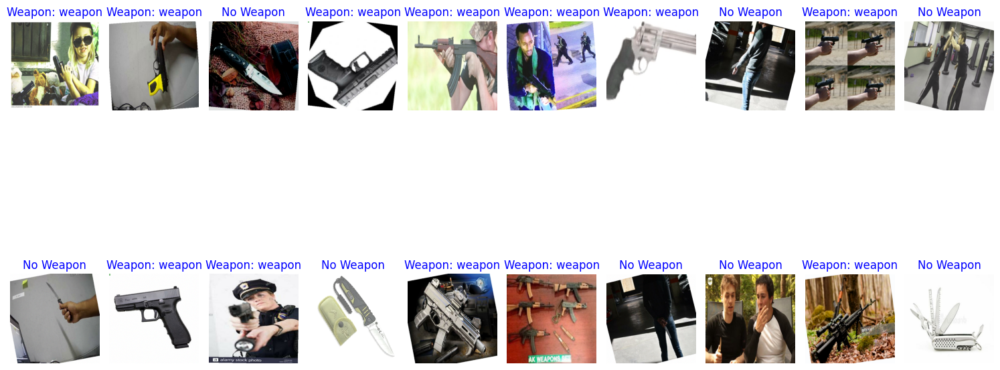

In [13]:

# Function to visualize an image with bounding boxes and labels
def plot_images_with_labels(images, pred_boxes, pred_labels, true_boxes=None, num_cols=3):
    num_images = len(images)
    num_rows = (num_images + num_cols - 1) // num_cols  # Calculate rows needed
    
    plt.figure(figsize=(15, num_rows * 5))
    
    for i in range(num_images):
        image = images[i]
        pred_box = pred_boxes[i]
        pred_label = pred_labels[i]
        true_box = true_boxes[i] if true_boxes else None
        
        ax = plt.subplot(num_rows, num_cols, i + 1)
        ax.imshow(image)
        
        # Predicted bounding box
        ax.add_patch(plt.Rectangle((pred_box[0], pred_box[1]), pred_box[2], pred_box[3],
                                   fill=False, color='red', linewidth=2, label="Predicted"))
        
        # True bounding box, if provided
        if true_box is not None:
            ax.add_patch(plt.Rectangle((true_box[0], true_box[1]), true_box[2], true_box[3],
                                       fill=False, color='green', linewidth=2, label="Ground Truth"))
        
        # Set title to display the predicted label
        label_text = "Weapon: " + pred_label if pred_label != "no weapon" else "No Weapon"
        ax.set_title(label_text, color="blue", fontsize=12)
        ax.axis('off')
    
    plt.tight_layout()
    plt.show()

# Loop through the test dataset and collect images, predicted boxes, and labels
images, pred_boxes, pred_labels, true_boxes = [], [], [], []
num_images = 20  # Number of images to display

for i, batch in enumerate(test_dataset.take(num_images)):
    image = batch[0][0].numpy()
    true_box = batch[1]['bbox_output'][0].numpy()
    
    # Get predictions
    class_pred, bbox_pred = model.predict(image[np.newaxis, ...])
    pred_class = class_pred.argmax(axis=1)[0]
    pred_label = "weapon" if pred_class > 0.9 else "no weapon"
    
    # Collect for display
    images.append(image)
    pred_boxes.append(bbox_pred[0])
    pred_labels.append(pred_label)
    true_boxes.append(true_box)
    
    if i >= num_images - 1:
        break

# Plot all images in a row with labels
plot_images_with_labels(images, pred_boxes, pred_labels, true_boxes, num_cols=10)



Image 1: 1743197710422.jpg
Prediction: knife
knife: 95.64%
gun: 1.93%
long_gun: 4.52%
Original Bounding Box: [0.2796791195869446, 0.2618824541568756, 0.5582017302513123, 0.6478409767150879]
Adjusted Bounding Box: [0.2573973107337952, 0.23100577235221864, 0.5804835391044617, 0.6787176585197449]
--------------------------------------------------

Image 2: armas--365--jpg_jpg.rf.c7bead4f6295d3e0119e0091b50087a5.jpg
Prediction: long_gun
knife: 1.57%
gun: 1.96%
long_gun: 97.45%
Original Bounding Box: [0.21833054721355438, 0.16392427682876587, 0.696748673915863, 0.6250407695770264]
Adjusted Bounding Box: [0.1800570970773697, 0.12703495740890502, 0.7350221240520477, 0.6619300889968872]
--------------------------------------------------

Image 3: DSC_0046_JPG.rf.2259c5ff82bf9f0f450083537935a665.jpg
Prediction: knife
knife: 96.78%
gun: 2.04%
long_gun: 2.83%
Original Bounding Box: [0.30938175320625305, 0.29923737049102783, 0.5052651166915894, 0.6034741401672363]
Adjusted Bounding Box: [0.293711

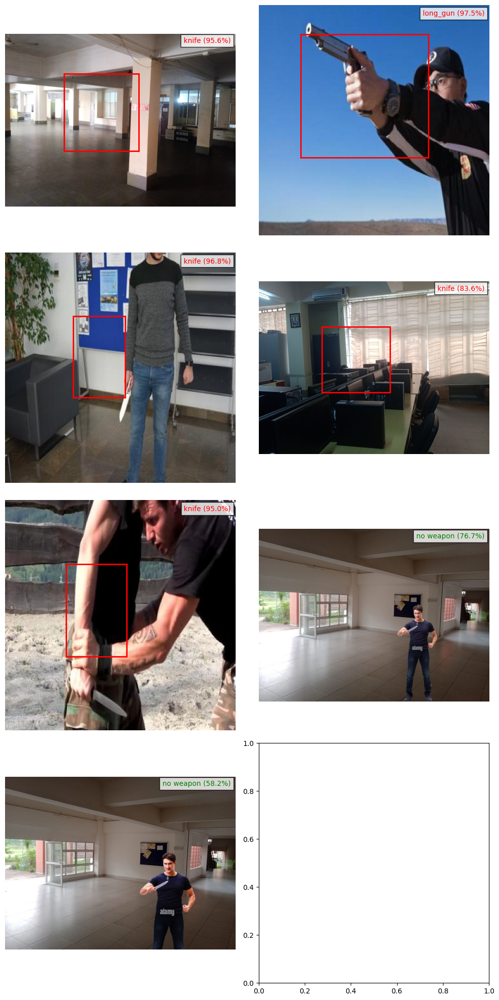

In [47]:
from tensorflow.keras.preprocessing import image as keras_image

def preprocess_image(img_path, model):
    img = keras_image.load_img(img_path, target_size=model.input_shape[1:3])
    img_array = keras_image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0) / 255.0  # Normalize
    return img_array

def adjust_bbox(bbox, correction_factor=0.08):
    """Apply a correction to bbox predictions based on observed error metrics"""
    # Adjust the coordinates slightly to compensate for systematic error
    # The correction factor is derived from the MAE value
    xmin, ymin, xmax, ymax = bbox
    
    # Calculate width and height
    width = xmax - xmin
    height = ymax - ymin
    
    # Apply small adjustments based on MAE
    # Expand the box slightly (based on observed MAE of 0.0403)
    xmin = max(0, xmin - width * correction_factor)
    ymin = max(0, ymin - height * correction_factor)
    xmax = min(1, xmax + width * correction_factor)
    ymax = min(1, ymax + height * correction_factor)
    
    return [xmin, ymin, xmax, ymax]

def plot_image_with_boxes(ax, img_array, boxes, prediction_label, confidence):
    ax.imshow(img_array)
    img_height, img_width = img_array.shape[:2]
    
    # Display label in top right corner
    if prediction_label == "no weapon":
        label_color = 'green'
        # No bounding box for "no weapon"
    else:
        label_color = 'red'
        # Draw bounding box for weapons
        for box in boxes:
            # Apply correction to bbox
            box = adjust_bbox(box)
            
            xmin, ymin, xmax, ymax = box
            if xmin < 1 and ymin < 1 and xmax < 1 and ymax < 1:
                xmin, xmax = xmin * img_width, xmax * img_width
                ymin, ymax = ymin * img_height, ymax * img_height
            ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                      edgecolor=label_color, linewidth=2, fill=False))
    
    # Place label in top right corner
    ax.text(img_width * 0.98, img_height * 0.02, 
            f"{prediction_label} ({confidence:.1%})",
            color=label_color, fontsize=10, 
            bbox=dict(facecolor='white', alpha=0.8),
            horizontalalignment='right', verticalalignment='top')
    
    ax.axis('off')

def test_model_on_folder(folder_path, model, num_images=4, threshold=0.9):
    image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('png', 'jpg', 'jpeg'))]
    num_rows = (min(num_images, len(image_files)) + 1) // 2  # 2 images per row
    fig, axes = plt.subplots(num_rows, 2, figsize=(10, 5 * num_rows))
    
    # Handle case with only one image
    if num_rows == 1 and len(image_files[:num_images]) == 1:
        axes = np.array([axes])
    elif num_rows == 1:
        axes = np.array([axes])
    
    for i, img_file in enumerate(image_files[:num_images]):
        row, col = i // 2, i % 2
        img_path = os.path.join(folder_path, img_file)
        img_array = preprocess_image(img_path, model)
        
        # Get predictions
        class_pred, bbox_pred = model.predict(img_array, verbose=0)
        max_prob = np.max(class_pred[0])
        class_idx = np.argmax(class_pred[0])
        
        # Map index to class name
        class_labels = ['knife', 'gun', 'long_gun']
        prediction_label = class_labels[class_idx] if max_prob > threshold else "no weapon"
        
        # Display image with predicted boxes
        img = keras_image.load_img(img_path)
        
        # Handle different array shapes for axes
        if len(axes.shape) == 1:
            current_ax = axes[col]
        else:
            current_ax = axes[row, col]
            
        plot_image_with_boxes(current_ax, np.array(img), [bbox_pred[0]], prediction_label, max_prob)
        
        # Print details
        print(f"\nImage {i+1}: {img_file}")
        print(f"Prediction: {prediction_label}")
        for j, label in enumerate(class_labels):
            print(f"{label}: {class_pred[0][j]:.2%}")
        
        # Print original and adjusted bbox
        original_bbox = bbox_pred[0].tolist()
        adjusted_bbox = adjust_bbox(original_bbox)
        print(f"Original Bounding Box: {original_bbox}")
        print(f"Adjusted Bounding Box: {adjusted_bbox}")
        print("-" * 50)
    
    # Hide empty subplot if odd number of images
    if num_images % 2 != 0 and len(image_files) >= num_images:
        if len(axes.shape) == 1 and len(axes) > 1:
            axes[-1].axis('off')
        elif len(axes.shape) > 1:
            axes[num_rows - 1, 1].axis('off')
    
    plt.tight_layout()
    plt.show()

# Test the model on images in a folder
folder_path = 'try/'  # Specify the path to your folder
test_model_on_folder(folder_path, model, num_images=10, threshold=0.8)